In [ ]:
conda install eli5

In [1]:
conda install -c conda-forge category_encoders 

Solving environment: ...working... 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - defaults/win-64::anaconda==2019.03=py37_0
done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install mlxtend  

In [318]:
import pandas as pd
import seaborn as sns
import warnings
import category_encoders as ce
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.exceptions import DataConversionWarning
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_predict
from IPython.display import display
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from mlxtend.plotting import plot_decision_regions
warnings.filterwarnings(action='ignore', category=DataConversionWarning)


test_features = pd.read_csv('test_features.csv')
train_features = pd.read_csv('train_features.csv')
train_labels = pd.read_csv('train_labels.csv')
sample_submission = pd.read_csv('sample_submission.csv')

In [319]:
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999
test_features.head(1)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321,True,GeoData Consultants Ltd,Parastatal,NaN,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other


In [521]:
combined = pd.concat([train_features, test_features])

In [320]:
train = pd.merge(train_labels, train_features, on='id', how='inner')
train.head(1)

,id,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,functional,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [522]:
# train_nonumeric_features = train.select_dtypes(exclude='number')
# test_nonumeric_features = test_features.select_dtypes(exclude='number')
# train_nonumeric_features.columns
combinednon = combined.select_dtypes(exclude='number')

In [523]:
# train_nonumeric_features = train_nonumeric_features.drop(columns = ['status_group','region','lga', 'date_recorded','funder', 'ward', 'installer', 'scheme_name', 'subvillage', 'wpt_name'])
# test_nonumeric_features = test_nonumeric_features.drop(columns = ['region','lga', 'date_recorded','funder', 'ward', 'installer', 'scheme_name', 'subvillage', 'wpt_name'])
combinednon = combinednon.drop(columns = ['region','lga', 'date_recorded','funder', 'ward', 'installer', 'scheme_name', 'subvillage', 'wpt_name'])

In [529]:
encoder = ce.OneHotEncoder(use_cat_names=True)
# train_encoded = encoder.fit_transform(train_nonumeric_features)
# test_encoded  = encoder.fit_transform(test_nonumeric_features)
combinednon = encoder.fit_transform(combinednon)
# train_encoded.shape, test_encoded.shape

In [530]:
# train_encoded.head(3)

In [531]:
# train_not_encoded = train.drop(columns = ['status_group', 'date_recorded', 'funder', 'installer', 'wpt_name',
#        'basin', 'subvillage', 'region', 'lga', 'ward', 'public_meeting',
#        'recorded_by', 'scheme_management', 'scheme_name', 'permit',
#        'extraction_type', 'extraction_type_group', 'extraction_type_class',
#        'management', 'management_group', 'payment', 'payment_type',
#        'water_quality', 'quality_group', 'quantity', 'quantity_group',
#        'source', 'source_type', 'source_class', 'waterpoint_type',
#        'waterpoint_type_group'])
# test_not_encoded = test_features.drop(columns = ['date_recorded', 'funder', 'installer', 'wpt_name',
#        'basin', 'subvillage', 'region', 'lga', 'ward', 'public_meeting',
#        'recorded_by', 'scheme_management', 'scheme_name', 'permit',
#        'extraction_type', 'extraction_type_group', 'extraction_type_class',
#        'management', 'management_group', 'payment', 'payment_type',
#        'water_quality', 'quality_group', 'quantity', 'quantity_group',
#        'source', 'source_type', 'source_class', 'waterpoint_type',
#        'waterpoint_type_group'])
# train.shape, train_not_encoded.shape, test_features.shape, test_not_encoded.shape
combined = combined.drop(columns = ['date_recorded', 'funder', 'installer', 'wpt_name',
       'basin', 'subvillage', 'region', 'lga', 'ward', 'public_meeting',
       'recorded_by', 'scheme_management', 'scheme_name', 'permit',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group'])

KeyError: "['date_recorded' 'funder' 'installer' 'wpt_name' 'basin' 'subvillage'\n 'region' 'lga' 'ward' 'public_meeting' 'recorded_by' 'scheme_management'\n 'scheme_name' 'permit' 'extraction_type' 'extraction_type_group'\n 'extraction_type_class' 'management' 'management_group' 'payment'\n 'payment_type' 'water_quality' 'quality_group' 'quantity'\n 'quantity_group' 'source' 'source_type' 'source_class' 'waterpoint_type'\n 'waterpoint_type_group'] not found in axis"

In [504]:
# train_not_encoded['key'] = 0
# test_not_encoded['key'] = 0
# train_encoded['key'] = 0
# test_encoded['key'] = 0

In [505]:
# train_merged = pd.merge(train_encoded, train_not_encoded, on='key', how='outer')

In [506]:
# train_not_encoded.columns

Index(['id', 'amount_tsh', 'gps_height', 'longitude', 'latitude',
       'num_private', 'region_code', 'district_code', 'population',
       'construction_year'],
      dtype='object')

In [507]:
# train_encoded['amount_tsh'] = train_not_encoded['amount_tsh']
# train_encoded['gps_height'] = train_not_encoded['gps_height']
# train_encoded['num_private'] = train_not_encoded['num_private']
# train_encoded['region_code'] = train_not_encoded['region_code']
# train_encoded['district_code'] = train_not_encoded['district_code']
# train_encoded['population'] = train_not_encoded['population']
# train_encoded['construction_year'] = train_not_encoded['construction_year']

In [508]:
# test_encoded['amount_tsh'] = test_not_encoded['amount_tsh']
# test_encoded['gps_height'] = test_not_encoded['gps_height']
# test_encoded['num_private'] = test_not_encoded['num_private']
# test_encoded['region_code'] = test_not_encoded['region_code']
# test_encoded['district_code'] = test_not_encoded['district_code']
# test_encoded['population'] = test_not_encoded['population']
# test_encoded['construction_year'] = test_not_encoded['construction_year']

In [532]:
combinednon['amount_tsh'] = combined['amount_tsh']
combinednon['gps_height'] = combined['gps_height']
combinednon['num_private'] = combined['num_private']
combinednon['region_code'] = combined['region_code']
combinednon['district_code'] = combined['district_code']
combinednon['population'] = combined['population']
combinednon['construction_year'] = combined['construction_year']

In [509]:
# df1 = pd.read_csv("yourdata.csv")
# df2 = pd.read_csv("yourdata2.csv")
# df2_key = df2.Colname2

## train_encoded.merge(train_not_encoded, on = 'key', how = 'outer')
# train_encoded_result = pd.DataFrame(columns=(test_not_encoded.columns.append(train_encoded.columns)).unique())
# train_encoded_result.to_csv("df3.csv",index_label=False)

# del(train_encoded)

# def preprocess(x):
#     train_encoded=pd.merge(test_not_encoded,x, left_on = "key", right_on = "key")
#     train_encoded.to_csv("df3.csv",mode="a",header=False,index=False)

# reader = pd.read_csv("train_encoded.csv", chunksize=1000) # chunksize depends with you colsize

# [preprocess(r) for r in reader]

In [533]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
# train_encoded = train_encoded.drop(columns = ['status_group'])
# train_encoded = pd.DataFrame(scaler.fit_transform(train_encoded), columns = train_encoded.columns)
# test_encoded = pd.DataFrame(scaler.fit_transform(test_encoded), columns = test_encoded.columns)
combinednon = pd.DataFrame(scaler.fit_transform(combinednon), columns = combinednon.columns)

In [511]:
# testlist = test_encoded.columns
# trainlist = train_encoded.columns
# for i in trainlist:
#     if i not in testlist:
#         print(i)

scheme_management_None
extraction_type_other - mkulima/shinyanga


In [512]:
# test_encoded['scheme_management_None'] = 0
# test_encoded['extraction_type_other - mkulima/shinyanga'] = 0
# test_encoded.shape, train_encoded.shape

((14358, 162), (59400, 162))

In [477]:
# train_encoded = train_encoded.reindex(sorted(train_encoded.columns), axis=1)
# test_encoded = test_encoded.reindex(sorted(test_encoded.columns), axis=1)

In [478]:
# train_encoded.columns

Index(['amount_tsh', 'basin_Internal', 'basin_Lake Nyasa', 'basin_Lake Rukwa',
       'basin_Lake Tanganyika', 'basin_Lake Victoria', 'basin_Pangani',
       'basin_Rufiji', 'basin_Ruvuma / Southern Coast', 'basin_Wami / Ruvu',
       ...
       'waterpoint_type_dam', 'waterpoint_type_group_cattle trough',
       'waterpoint_type_group_communal standpipe', 'waterpoint_type_group_dam',
       'waterpoint_type_group_hand pump',
       'waterpoint_type_group_improved spring', 'waterpoint_type_group_other',
       'waterpoint_type_hand pump', 'waterpoint_type_improved spring',
       'waterpoint_type_other'],
      dtype='object', length=162)

In [479]:
# test_encoded.columns

Index(['amount_tsh', 'basin_Internal', 'basin_Lake Nyasa', 'basin_Lake Rukwa',
       'basin_Lake Tanganyika', 'basin_Lake Victoria', 'basin_Pangani',
       'basin_Rufiji', 'basin_Ruvuma / Southern Coast', 'basin_Wami / Ruvu',
       ...
       'waterpoint_type_dam', 'waterpoint_type_group_cattle trough',
       'waterpoint_type_group_communal standpipe', 'waterpoint_type_group_dam',
       'waterpoint_type_group_hand pump',
       'waterpoint_type_group_improved spring', 'waterpoint_type_group_other',
       'waterpoint_type_hand pump', 'waterpoint_type_improved spring',
       'waterpoint_type_other'],
      dtype='object', length=162)

In [480]:
# train_encoded.describe()

,amount_tsh,basin_Internal,basin_Lake Nyasa,basin_Lake Rukwa,basin_Lake Tanganyika,basin_Lake Victoria,basin_Pangani,basin_Rufiji,basin_Ruvuma / Southern Coast,basin_Wami / Ruvu,construction_year,district_code,extraction_type_afridev,extraction_type_cemo,extraction_type_class_gravity,extraction_type_class_handpump,extraction_type_class_motorpump,extraction_type_class_other,extraction_type_class_rope pump,extraction_type_class_submersible,extraction_type_class_wind-powered,extraction_type_climax,extraction_type_gravity,extraction_type_group_afridev,extraction_type_group_gravity,extraction_type_group_india mark ii,extraction_type_group_india mark iii,extraction_type_group_mono,extraction_type_group_nira/tanira,extraction_type_group_other,extraction_type_group_other handpump,extraction_type_group_other motorpump,extraction_type_group_rope pump,extraction_type_group_submersible,extraction_type_group_swn 80,extraction_type_group_wind-powered,extraction_type_india mark ii,extraction_type_india mark iii,extraction_type_ksb,extraction_type_mono,extraction_type_nira/tanira,extraction_type_other,extraction_type_other - mkulima/shinyanga,extraction_type_other - play pump,extraction_type_other - rope pump,extraction_type_other - swn 81,extraction_type_submersible,extraction_type_swn 80,extraction_type_walimi,extraction_type_windmill,gps_height,management_company,management_group_commercial,management_group_other,management_group_parastatal,management_group_unknown,management_group_user-group,management_other,management_other - school,management_parastatal,management_private operator,management_trust,management_unknown,management_vwc,management_water authority,management_water board,management_wua,management_wug,num_private,payment_never pay,payment_other,payment_pay annually,payment_pay monthly,payment_pay per bucket,payment_pay when scheme fails,payment_type_annually,payment_type_monthly,payment_type_never pay,payment_type_on failure,payment_type_other,payment_type_per bucket,payment_type_unknown,payment_unknown,permit_False,permit_True,permit_nan,population,public_meeting_False,public_meeting_True,public_meeting_nan,quality_group_colored,quality_group_fluoride,quality_group_good,quality_group_milky,quality_group_salty,quality_group_unknown,quantity_dry,quantity_enough,quantity_group_dry,quantity_group_enough,quantity_group_insufficient,quantity_group_seasonal,quantity_group_unknown,quantity_insufficient,quantity_seasonal,quantity_unknown,recorded_by_GeoData Consultants Ltd,region_code,scheme_management_Company,scheme_management_None,scheme_management_Other,scheme_management_Parastatal,scheme_management_Private operator,scheme_management_SWC,scheme_management_Trust,scheme_management_VWC,scheme_management_WUA,scheme_management_WUG,scheme_management_Water Board,scheme_management_Water authority,scheme_management_nan,source_class_groundwater,source_class_surface,source_class_unknown,source_dam,source_hand dtw,source_lake,source_machine dbh,source_other,source_rainwater harvesting,source_river,source_shallow well,source_spring,source_type_borehole,source_type_dam,source_type_other,source_type_rainwater harvesting,source_type_river/lake,source_type_shallow well,source_type_spring,source_unknown,water_quality_coloured,water_quality_fluoride,water_quality_fluoride abandoned,water_quality_milky,water_quality_salty,water_quality_salty abandoned,water_quality_soft,water_quality_unknown,waterpoint_type_cattle trough,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_dam,waterpoint_type_group_cattle trough,waterpoint_type_group_communal standpipe,waterpoint_type_group_dam,waterpoint_type_group_hand pump,waterpoint_type_group_improved spring,waterpoint_type_group_other,waterpoint_type_hand pump,waterpoint_type_improved spring,waterpoint_type_other
count,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000,

In [534]:
train_features.shape, test_features.shape

((59400, 40), (14358, 40))

In [535]:
from sklearn.model_selection import train_test_split


def train_validation_test_split(
    X, y, train_size=0.8, val_size=0.1, test_size=0.1, 
    random_state=None, shuffle=True):
        
    assert train_size + val_size + test_size == 1
    
    X_train_val, X_test, y_train_val, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, shuffle=shuffle)
    
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, test_size=val_size/(train_size+val_size), 
        random_state=random_state, shuffle=shuffle)
    
    return X_train, X_val, X_test, y_train, y_val, y_test

X = combinednon.iloc[:59400]
X_train, X_val, X_test, y_train, y_val, y_test = train_validation_test_split(
    X, train['status_group'], train_size=0.8, val_size=0.1, test_size=0.1, random_state=1)


In [536]:
# X_train, X_test, y_train, y_test = train_test_split(train_encoded, train['status_group'], train_size=0.80, test_size=0.20, 
#                                                     random_state=42, stratify=train['status_group'])
# X_train = train_encoded
# y_train = train['status_group']
# X_test = test_encoded
# y_test = sample_submission['status_group']
log_reg = LogisticRegression(solver='lbfgs')
log_reg.fit(X_train, y_train)
score = log_reg.score(X_train, y_train)
print('Train Accuracy Score', score)

C:\Users\lilyx\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\lilyx\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\lilyx\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


Train Accuracy Score 0.7311447811447811


C:\Users\lilyx\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


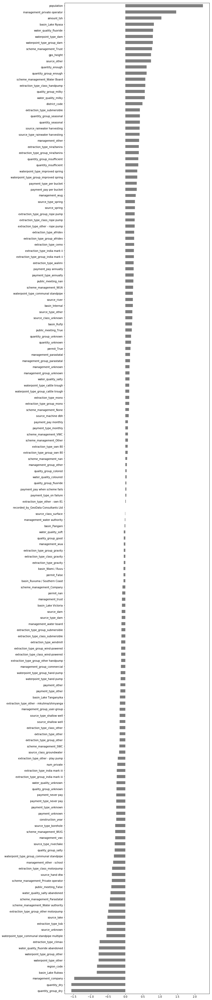

In [537]:
coefficients = pd.Series(log_reg.coef_[0], X_train.columns)
plt.figure(figsize=(10,70))
coefficients.sort_values().plot.barh(color='grey');

In [538]:
y_train.head(2)

49351        functional
43418    non functional
Name: status_group, dtype: object

In [539]:
import numpy as np
y_train = pd.Series(np.where(y_train.values == 'functional', 1, 0),
                    y_train.index)
y_test = pd.Series(np.where(y_test.values == 'functional', 1, 0),
                    y_test.index)

In [540]:
from sklearn.model_selection import RandomizedSearchCV

param_distributions = {
     'n_estimators': [100, 200],
     'max_depth': [15]
}

randomsearch = RandomizedSearchCV(
    RandomForestClassifier(n_jobs=-1, random_state=42),
    param_distributions=param_distributions,
    n_iter = 20,
    cv=3,
    scoring='accuracy',
    verbose=10,
    return_train_score=True
)

randomsearch.fit(X_train, y_train)

C:\Users\lilyx\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:271: UserWarning: The total space of parameters 2 is smaller than n_iter=20. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 3 folds for each of 2 candidates, totalling 6 fits
[CV] n_estimators=100, max_depth=15 ..................................
[CV]  n_estimators=100, max_depth=15, score=0.8002651347768449, total=   3.4s
[CV] n_estimators=100, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.7s remaining:    0.0s


[CV]  n_estimators=100, max_depth=15, score=0.7992424242424242, total=   1.6s
[CV] n_estimators=100, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    5.6s remaining:    0.0s


[CV]  n_estimators=100, max_depth=15, score=0.7910221604899299, total=   1.6s
[CV] n_estimators=200, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.6s remaining:    0.0s


[CV]  n_estimators=200, max_depth=15, score=0.8021589546114513, total=   3.0s
[CV] n_estimators=200, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   11.0s remaining:    0.0s


[CV]  n_estimators=200, max_depth=15, score=0.7996212121212121, total=   3.1s
[CV] n_estimators=200, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   14.5s remaining:    0.0s


[CV]  n_estimators=200, max_depth=15, score=0.7909590251909843, total=   3.1s


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:   18.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:   18.1s finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=-1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=20, n_jobs=None,
          param_distributions={'n_estimators': [100, 200], 'max_depth': [15]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score=True, scoring='accuracy', verbose=10)

In [541]:
randomsearch.best_score_

0.7975799663299663

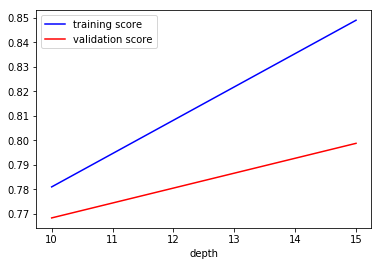

In [559]:
from sklearn.model_selection import validation_curve
from sklearn.ensemble import RandomForestClassifier


model = RandomForestClassifier(n_estimators=100)

depth = [10,15]#try a variety of parameters for model
train_score, val_score = validation_curve(
    model, X_train, y_train,
    param_name='max_depth', param_range=depth, 
    scoring='accuracy', cv=3)

plt.plot(depth, np.median(train_score, 1), color='blue', label='training score')
plt.plot(depth, np.median(val_score, 1), color='red', label='validation score')
plt.legend(loc='best')
plt.xlabel('depth');

In [543]:
from sklearn.metrics import accuracy_score
# best = randomsearch.best_estimator_
# y_pred_proba = best.predict_proba(X_train.values)[:,1]
# print('Test Accuracy:', accuracy_score(y_train, y_pred_proba))

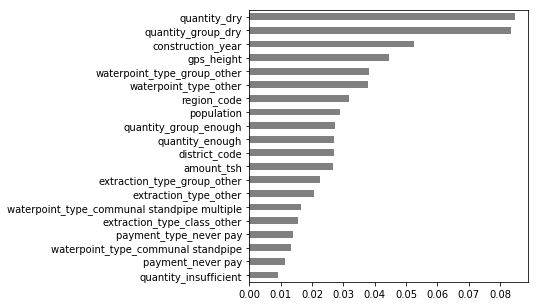

In [544]:
n = 20
figsize = (5,5)

importances = pd.Series(best.feature_importances_,X_train.columns)
top_n = importances.sort_values()[-n:]
plt.figure(figsize=figsize)
top_n.plot.barh(color='gray');

In [551]:
# from xgboost import XGBClassifier
# from scipy.stats import randint

# param_distributions = {
#     'n_estimators': randint(50, 70), 
#     'max_depth': [10]
# }

# # n_iter & cv parameters are low here so the example runs faster
# search = RandomizedSearchCV(
#     estimator=XGBClassifier(n_jobs=-1, random_state=42), 
#     param_distributions=param_distributions, 
#     n_iter=10, 
#     scoring='accuracy', 
#     n_jobs=-1, 
#     cv=2, 
#     verbose=10, 
#     return_train_score=True, 
#     random_state=42
# )

# search.fit(X_train, y_train)

Fitting 2 folds for each of 10 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed:   27.7s remaining:   41.6s
[Parallel(n_jobs=-1)]: Done  11 out of  20 | elapsed:   45.0s remaining:   36.8s
[Parallel(n_jobs=-1)]: Done  14 out of  20 | elapsed:   49.5s remaining:   21.1s
[Parallel(n_jobs=-1)]: Done  17 out of  20 | elapsed:   58.2s remaining:   10.2s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:   59.1s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:   59.1s finished


RandomizedSearchCV(cv=2, error_score='raise-deprecating',
          estimator=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=-1, nthread=None, objective='binary:logistic',
       random_state=42, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=1),
          fit_params=None, iid='warn', n_iter=10, n_jobs=-1,
          param_distributions={'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000170C06F6080>, 'max_depth': [10]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score=True, scoring='accuracy', verbose=10)

In [547]:
X_val

,basin_Lake Nyasa,basin_Lake Victoria,basin_Pangani,basin_Ruvuma / Southern Coast,basin_Internal,basin_Lake Tanganyika,basin_Wami / Ruvu,basin_Rufiji,basin_Lake Rukwa,public_meeting_True,public_meeting_nan,public_meeting_False,recorded_by_GeoData Consultants Ltd,scheme_management_VWC,scheme_management_Other,scheme_management_nan,scheme_management_Private operator,scheme_management_WUG,scheme_management_Water Board,scheme_management_WUA,scheme_management_Water authority,scheme_management_Company,scheme_management_Parastatal,scheme_management_Trust,scheme_management_SWC,scheme_management_None,permit_False,permit_True,permit_nan,extraction_type_gravity,extraction_type_submersible,extraction_type_swn 80,extraction_type_nira/tanira,extraction_type_india mark ii,extraction_type_other,extraction_type_ksb,extraction_type_mono,extraction_type_windmill,extraction_type_afridev,extraction_type_other - rope pump,extraction_type_india mark iii,extraction_type_other - swn 81,extraction_type_other - play pump,extraction_type_cemo,extraction_type_climax,extraction_type_walimi,extraction_type_other - mkulima/shinyanga,extraction_type_group_gravity,extraction_type_group_submersible,extraction_type_group_swn 80,extraction_type_group_nira/tanira,extraction_type_group_india mark ii,extraction_type_group_other,extraction_type_group_mono,extraction_type_group_wind-powered,extraction_type_group_afridev,extraction_type_group_rope pump,extraction_type_group_india mark iii,extraction_type_group_other handpump,extraction_type_group_other motorpump,extraction_type_class_gravity,extraction_type_class_submersible,extraction_type_class_handpump,extraction_type_class_other,extraction_type_class_motorpump,extraction_type_class_wind-powered,extraction_type_class_rope pump,management_vwc,management_wug,management_other,management_private operator,management_water board,management_wua,management_company,management_water authority,management_parastatal,management_unknown,management_other - school,management_trust,management_group_user-group,management_group_other,management_group_commercial,management_group_parastatal,management_group_unknown,payment_pay annually,payment_never pay,payment_pay per bucket,payment_unknown,payment_pay when scheme fails,payment_other,payment_pay monthly,payment_type_annually,payment_type_never pay,payment_type_per bucket,payment_type_unknown,payment_type_on failure,payment_type_other,payment_type_monthly,water_quality_soft,water_quality_salty,water_quality_milky,water_quality_unknown,water_quality_fluoride,water_quality_coloured,water_quality_salty abandoned,water_quality_fluoride abandoned,quality_group_good,quality_group_salty,quality_group_milky,quality_group_unknown,quality_group_fluoride,quality_group_colored,quantity_enough,quantity_insufficient,quantity_dry,quantity_seasonal,quantity_unknown,quantity_group_enough,quantity_group_insufficient,quantity_group_dry,quantity_group_seasonal,quantity_group_unknown,source_spring,source_rainwater harvesting,source_dam,source_machine dbh,source_other,source_shallow well,source_river,source_hand dtw,source_lake,source_unknown,source_type_spring,source_type_rainwater harvesting,source_type_dam,source_type_borehole,source_type_other,source_type_shallow well,source_type_river/lake,source_class_groundwater,source_class_surface,source_class_unknown,waterpoint_type_communal standpipe,waterpoint_type_communal standpipe multiple,waterpoint_type_hand pump,waterpoint_type_other,waterpoint_type_improved spring,waterpoint_type_cattle trough,waterpoint_type_dam,waterpoint_type_group_communal standpipe,waterpoint_type_group_hand pump,waterpoint_type_group_other,waterpoint_type_group_improved spring,waterpoint_type_group_cattle trough,waterpoint_type_group_dam,amount_tsh,gps_height,num_private,region_code,district_code,population,construction_year
49964,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [567]:
y_pred = log_reg.predict(X_val)

In [568]:
y_pred = pd.Series(np.where(y_test.values == 1, 'functional', 'non functional'))

In [573]:
y_val

49964             non functional
13243             non functional
43968                 functional
59106                 functional
6752                  functional
38979                 functional
58908                 functional
5977              non functional
20221                 functional
36747             non functional
42171             non functional
48318             non functional
19565             non functional
3004              non functional
48089                 functional
26797                 functional
8483              non functional
56019             non functional
29748                 functional
19736                 functional
30360                 functional
47849                 functional
34715             non functional
16417                 functional
48379                 functional
43538                 functional
50841             non functional
135                   functional
54741                 functional
56839             non functional
34564     

In [569]:
accuracy_score(y_val, y_pred)

0.47373737373737373

In [580]:
# y_pred_proba = best.predict_proba(X_test.values)[:,1]
# print('Test accuracy:', accuracy_score(y_test, y_pred_proba))
X = combinednon.iloc[:59400]
X = X.loc[:, ['population', 'management_private operator', 'amount_tsh', 'basin_Lake Nyasa', 'quantity_dry', 'quantity_enough']]
y = train['status_group']
y = y.iloc[:59400]
X_train, X_val, X_test, y_train, y_val, y_test = train_validation_test_split(
    X, y, train_size=0.8, val_size=0.1, test_size=0.1, random_state=1)


In [581]:
param_distributions = {
     'n_estimators': [100, 200],
     'max_depth': [15]
}

randomsearch = RandomizedSearchCV(
    RandomForestClassifier(n_jobs=-1, random_state=42),
    param_distributions=param_distributions,
    n_iter = 20,
    cv=3,
    scoring='accuracy',
    verbose=10,
    return_train_score=True
)

randomsearch.fit(X_train, y_train)

C:\Users\lilyx\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:271: UserWarning: The total space of parameters 2 is smaller than n_iter=20. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 3 folds for each of 2 candidates, totalling 6 fits
[CV] n_estimators=100, max_depth=15 ..................................
[CV]  n_estimators=100, max_depth=15, score=0.6567135913136797, total=   2.4s
[CV] n_estimators=100, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.6s remaining:    0.0s


[CV]  n_estimators=100, max_depth=15, score=0.6574711192475222, total=   0.5s
[CV] n_estimators=100, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.3s remaining:    0.0s


[CV]  n_estimators=100, max_depth=15, score=0.6513448667761081, total=   0.6s
[CV] n_estimators=200, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.1s remaining:    0.0s


[CV]  n_estimators=200, max_depth=15, score=0.6575342465753424, total=   1.1s
[CV] n_estimators=200, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    5.7s remaining:    0.0s


[CV]  n_estimators=200, max_depth=15, score=0.6569661006249605, total=   1.1s
[CV] n_estimators=200, max_depth=15 ..................................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    7.1s remaining:    0.0s


[CV]  n_estimators=200, max_depth=15, score=0.6514711453466346, total=   1.0s


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    8.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    8.5s finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=-1,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=20, n_jobs=None,
          param_distributions={'n_estimators': [100, 200], 'max_depth': [15]},
          pre_dispatch='2*n_jobs', random_state=None, refit=True,
          return_train_score=True, scoring='accuracy', verbose=10)

In [583]:
y_pred = randomsearch.predict(X_val)

In [584]:
accuracy_score(y_val, y_pred)

0.657070707070707

In [591]:
original_test_features = combinednon.iloc[59400 :]
original_test_features = original_test_features.loc[:, ['population', 'management_private operator', 'amount_tsh', 'basin_Lake Nyasa', 'quantity_dry', 'quantity_enough']]
y_pred = randomsearch.predict(original_test_features)

In [592]:
test_features.shape

(14358, 40)

In [593]:
len(y_pred)
# y_pred = pd.Series(np.where(y_test.values == 1, 'functional', 'non functional'))

14358

In [594]:
submission['status_group'] = y_pred
submission.to_csv('lilysu-tanzania-submission-008.csv', index=False)

In [595]:
df = pd.read_csv('lilysu-tanzania-submission-008.csv')
df.describe()

,id
count,14358.000000
mean,37232.859799
std,21382.890432
min,10.000000
25%,18765.500000
50%,37442.000000
75%,55909.250000
max,74249.000000


In [366]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

def train_validation_test_split(
    X, y, train_size=0.8, val_size=0.1, test_size=0.1, 
    random_state=None, shuffle=True):
        
    assert train_size + val_size + test_size == 1
    
    X_train_val, X_test, y_train_val, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, shuffle=shuffle)
    
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, test_size=val_size/(train_size+val_size), 
        random_state=random_state, shuffle=shuffle)
    
    return X_train, X_val, X_test, y_train, y_val, y_test

X_train, X_val, X_test, y_train, y_val, y_test = train_validation_test_split(
    X_train, y_train, train_size=0.8, val_size=0.1, test_size=0.1, random_state=1)


# 3. Fit model

# Try re-running the cell with different values for this parameter
class_weight = None

model = LogisticRegression(solver='lbfgs', class_weight=class_weight)
model.fit(X_train.values, y_train)


# 4. Evaluate model

y_pred = model.predict(X_val)
print(classification_report(y_val, y_pred))
print('accuracy', accuracy_score(y_val, y_pred))
display(pd.DataFrame(
    confusion_matrix(y_val, y_pred), 
    columns=['Predicted Negative', 'Predicted Positive'], 
    index=['Actual Negative', 'Actual Positive']))


# 5. Visualize decision regions

plt.figure(figsize=(10, 6))
plot_decision_regions(X_val, y_val, model, legend=0);

              precision    recall  f1-score   support

           0       0.80      0.62      0.70      1746
           1       0.73      0.87      0.79      2056

   micro avg       0.75      0.75      0.75      3802
   macro avg       0.76      0.74      0.74      3802
weighted avg       0.76      0.75      0.75      3802

accuracy 0.7530247238295634


C:\Users\lilyx\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


,Predicted Negative,Predicted Positive
Actual Negative,1077,669
Actual Positive,270,1786


ValueError: X must be a NumPy array. Found <class 'pandas.core.frame.DataFrame'>

<Figure size 720x432 with 0 Axes>

In [369]:
print('Area under the Receiver Operating Characteristic curve:', 
      roc_auc_score(y_val, y_pred))

Area under the Receiver Operating Characteristic curve: 0.7427577653870325


In [379]:
y_pred = model.predict(test_encoded)
y_pred

array([1, 1, 1, ..., 1, 0, 1])

In [380]:
y_pred = pd.Series(np.where(y_test.values == 1, 'functional', 'non functional'))

In [381]:
y_pred.head(3)

0    non functional
1        functional
2        functional
dtype: object

In [382]:
submission['status_group'] = y_pred
submission.to_csv('lilysu-tanzania-submission-008.csv', index=False)

In [383]:
df = pd.read_csv('lilysu-tanzania-submission-008.csv')
df.head(3)

,id,status_group
0,50785,non functional
1,51630,functional
2,17168,functional


In [386]:
train_labels.describe()

,id
count,59400.000000
mean,37115.131768
std,21453.128371
min,0.000000
25%,18519.750000
50%,37061.500000
75%,55656.500000
max,74247.000000


In [389]:
df['status_group'].value_counts(normalize = True)

functional        0.542083
non functional    0.457917
Name: status_group, dtype: float64

In [390]:
train['status_group'].value_counts(normalize = True)

functional                 0.543081
non functional             0.384242
functional needs repair    0.072677
Name: status_group, dtype: float64